Advanced Lane Finding Project

The goals / steps of this project are the following:

+ Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
+ Apply a distortion correction to raw images.
+ Use color transforms, gradients, etc., to create a thresholded binary image.
+ Apply a perspective transform to rectify binary image ("birds-eye view").
+ Detect lane pixels and fit to find the lane boundary.
+ Determine the curvature of the lane and vehicle position with respect to center.
+ Warp the detected lane boundaries back onto the original image.
+ Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
import pickle
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

### 1. Compute the camera calibration matrix and distortion coefficients

In [2]:
# prepare object points
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
# cv2.destroyAllWindows()
print(len(objpoints))
print(len(imgpoints))

17
17


In [4]:
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
# dist_pickle["mtx"] = mtx
# dist_pickle["dist"] = dist
dist_pickle["objpoints"] = objpoints
dist_pickle["imgpoints"] = imgpoints
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )

In [3]:
# A function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    # undist = np.copy(img)  # Delete this line
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs =  cv2.calibrateCamera(objpoints, imgpoints, \
                                    img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### 2. Apply a distortion correction to raw images

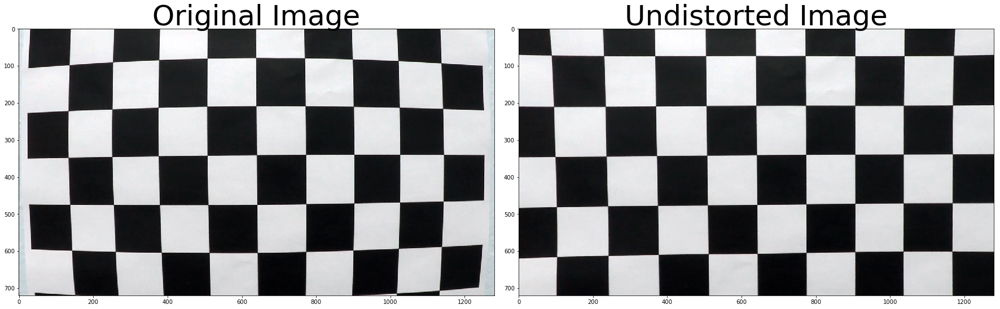

In [5]:
# Read in the saved objpoints and imgpoints
dist_pickle = pickle.load( open( "wide_dist_pickle.p", "rb" ) )
objpoints = dist_pickle["objpoints"]
imgpoints = dist_pickle["imgpoints"]

# Read in an image
img = cv2.imread('camera_cal/calibration1.jpg')

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
chessboard = glob.glob('camera_cal/*.jpg')
for img in chessboard:
    img = mpimg.imread(img)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

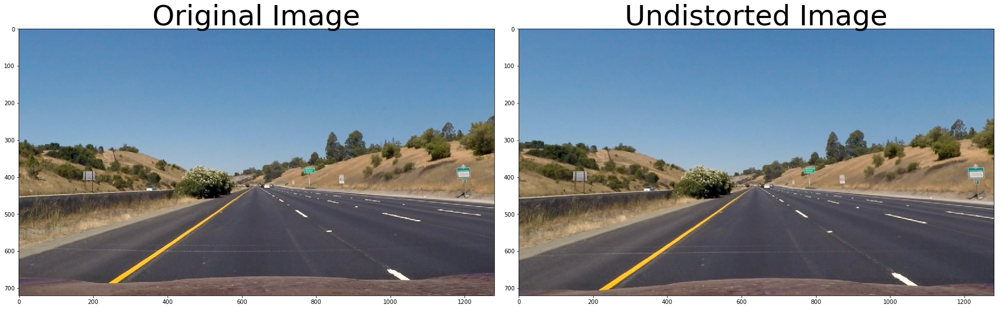

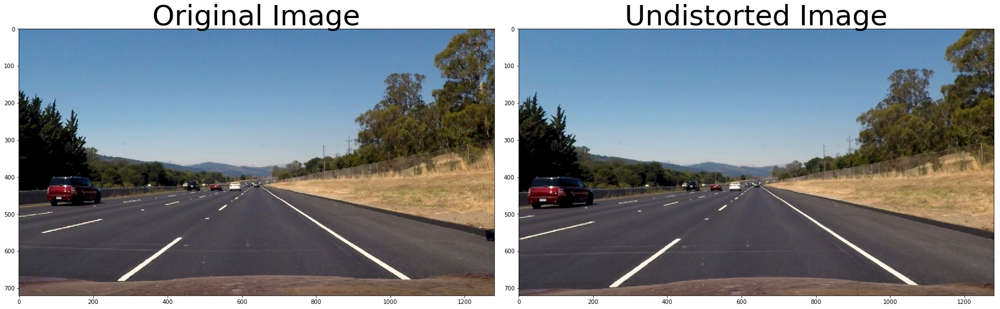

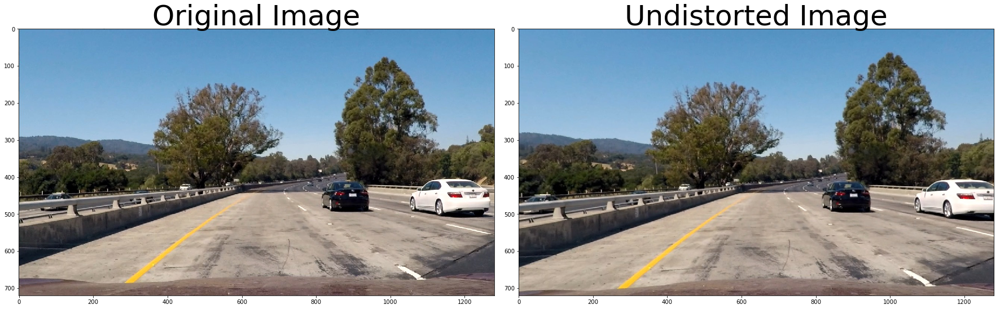

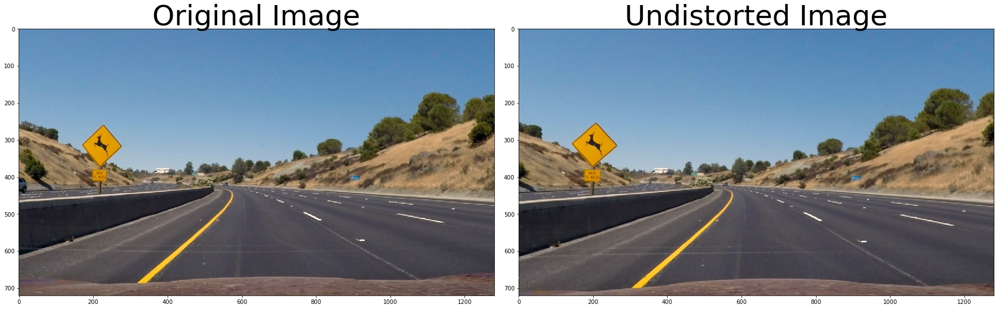

In [10]:
test_image = glob.glob('test_images/*.jpg')
for img in test_image[:4]:

    img = mpimg.imread(img)

    udis = cal_undistort(img, objpoints, imgpoints)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(udis)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 3. create a thresholded binary image

In [6]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh=(0,255), sobel_kernel=3):

    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img,
                                          cv2.CV_64F,
                                          1, 0,
                                          ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img,
                                          cv2.CV_64F,
                                          0, 1,
                                          ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [7]:
def binary_pipeline(img, orient='x', hls_thresh=(70, 255), sx_thresh=(20, 100), color=True):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]

    sxbinary = abs_sobel_thresh(s_channel,
                                orient=orient,
                                thresh=sx_thresh,
                                sobel_kernel=3)
    if color==True:
        # Threshold color channel
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= hls_thresh[0]) & (s_channel <= hls_thresh[1])] = 1
        # Stack each channel
        # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
        # be beneficial to replace this channel with something else.
        f_binary = np.zeros_like(s_channel)
        
        f_binary[s_binary>0] = 1
        f_binary[sxbinary>0] = 1

        return f_binary
    return sx_binary

In [8]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

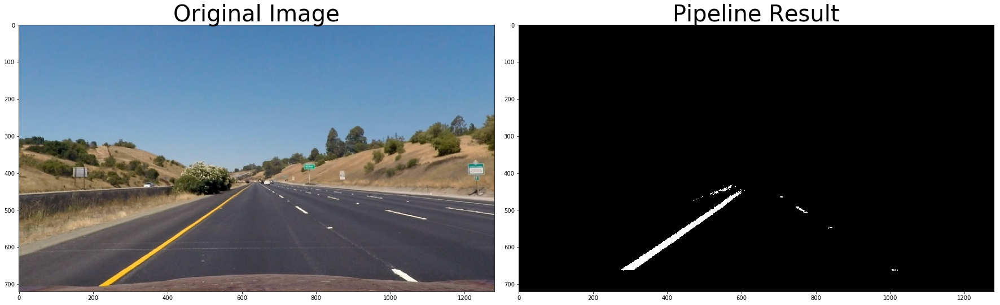

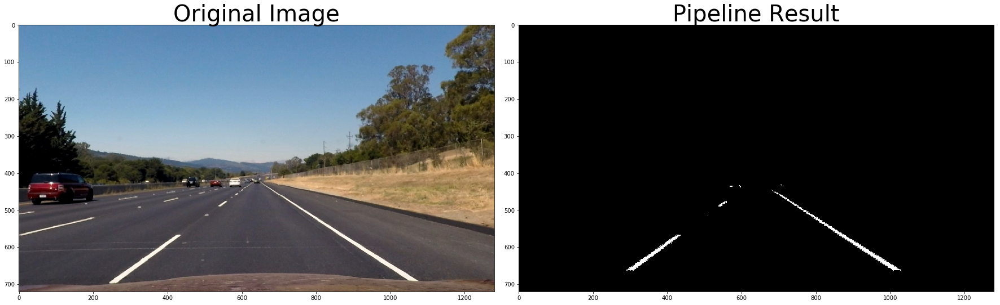

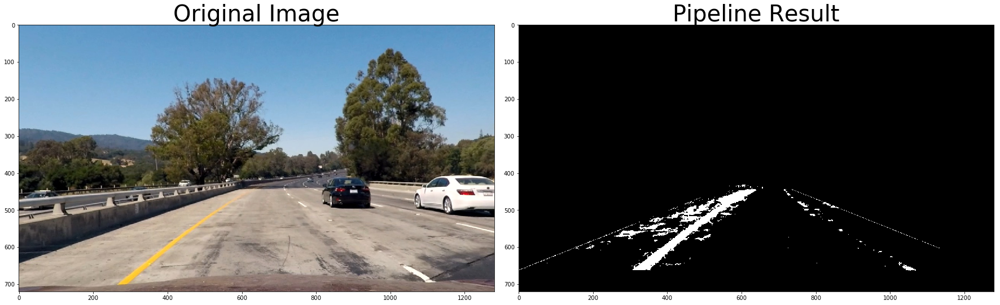

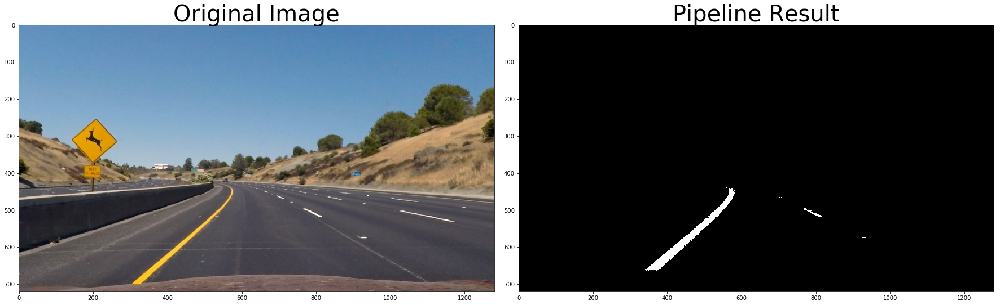

In [9]:

test_image = glob.glob('test_images/*.jpg')
for img in test_image[:4]:

    img = mpimg.imread(img)

    image = cal_undistort(img, objpoints, imgpoints)


    imshape = image.shape

    vertices = np.array(
        [[(0*imshape[1], 0.92 * imshape[0]),
          (0.45*imshape[1], 0.60*imshape[0]),
          (0.55*imshape[1], 0.60*imshape[0]),
          (imshape[1], 0.92 * imshape[0])]],
        dtype=np.int32)

    masked_image = region_of_interest(image, vertices)

    result = binary_pipeline(masked_image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 4. Apply a perspective transform

In [11]:
def draw_line(img1, img2):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(
                    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
                    [((img_size[0] / 6) - 10), img_size[1]],
                    [(img_size[0] * 5 / 6) + 60, img_size[1]],
                    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
                    [[(img_size[0] / 4), 0],
                    [(img_size[0] / 4), img_size[1]],
                    [(img_size[0] * 3 / 4), img_size[1]],
                    [(img_size[0] * 3 / 4), 0]])
    
    cv2.line(img1,
             (src[0][0], src[0][1]), (src[1][0], src[1][1]),
             color=(255,0,0), thickness=4)
    cv2.line(img1,
             (src[2][0], src[2][1]), (src[3][0], src[3][1]),
             color=(255,0,0), thickness=4)
    cv2.line(img1, 
             (src[0][0], src[0][1]), (src[3][0], src[3][1]),
             color=(255,0,0), thickness=4)
    cv2.line(img2, 
             (dst[0][0], dst[0][1]), (dst[1][0], dst[1][1]),
             color=(255,0,0), thickness=4)
    cv2.line(img2, 
             (dst[2][0], dst[2][1]), (dst[3][0], dst[3][1]),
             color=(255,0,0), thickness=4)

In [12]:
def warp(img):
    
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(
                    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
                    [((img_size[0] / 6) - 10), img_size[1]],
                    [(img_size[0] * 5 / 6) + 60, img_size[1]],
                    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
                    [[(img_size[0] / 4), 0],
                    [(img_size[0] / 4), img_size[1]],
                    [(img_size[0] * 3 / 4), img_size[1]],
                    [(img_size[0] * 3 / 4), 0]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img,
                                 M,
                                 img_size,
                                 flags=cv2.INTER_LINEAR)

    return warped

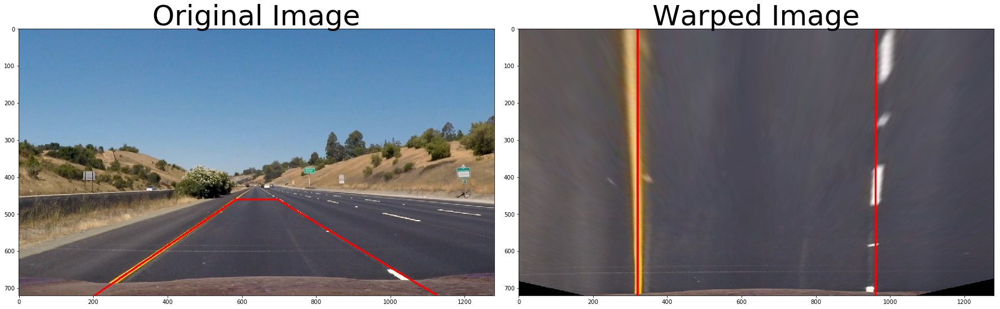

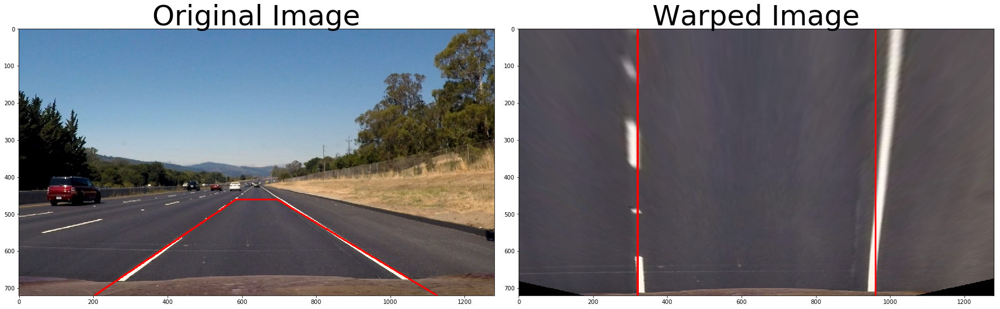

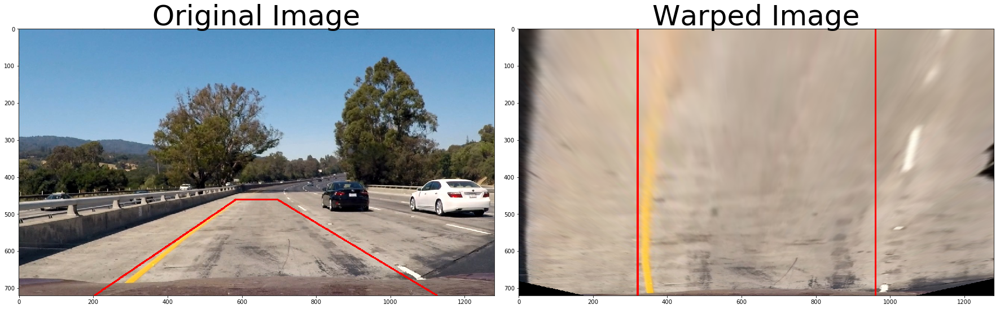

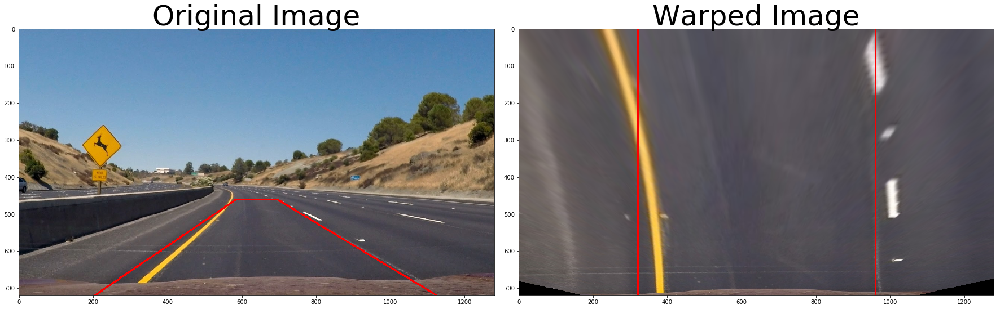

In [13]:
# Read in an image
for img in test_image[:4]:
    
    img = mpimg.imread(img)
    
    udis = cal_undistort(img, objpoints, imgpoints)
    
    wraped = warp(udis)
    
    draw_line(img, wraped)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(wraped)
    ax2.set_title('Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
def warp_binary(img):
    
    binary = binary_pipeline(img, 
                             orient='x', 
                             hls_thresh=(100, 230),
                             sx_thresh=(10, 150),
                            color=True)
    warped = warp(binary)
    
    return warped

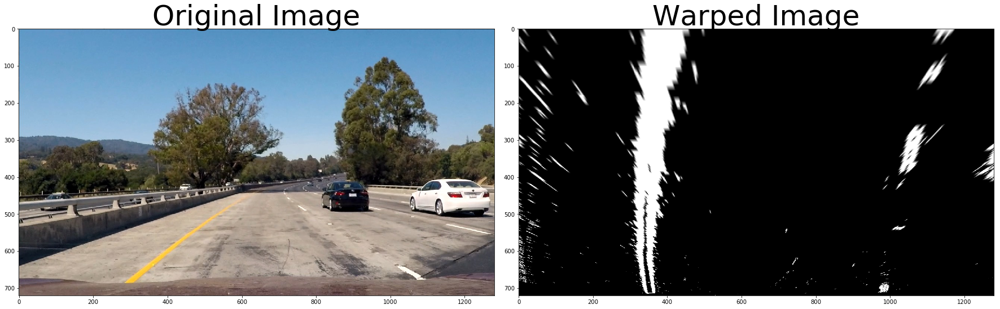

In [15]:
# Read in an image
img = mpimg.imread('test_images/test1.jpg')

dist = cal_undistort(img, objpoints, imgpoints)

binary_warped = warp_binary(dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

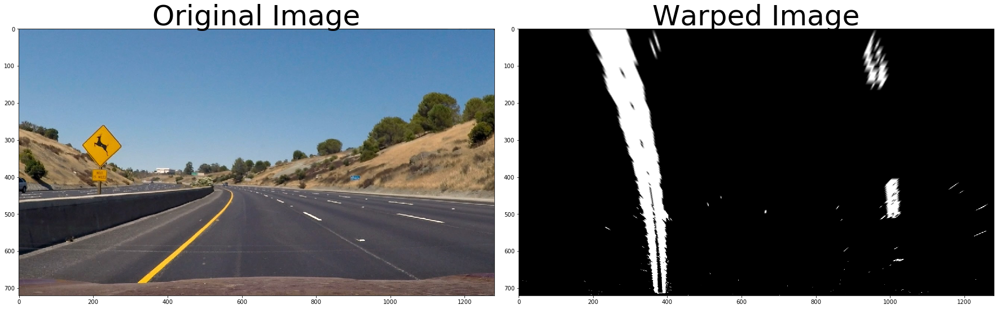

In [16]:
# Read in an image
img = mpimg.imread('test_images/test2.jpg')

dist = cal_undistort(img, objpoints, imgpoints)

binary_warped = warp_binary(dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 5. Detect lane pixels

/Users/RyanG/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


(720, 0)

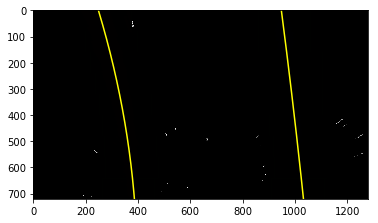

In [17]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()

nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base

# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 0
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                      & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                       & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

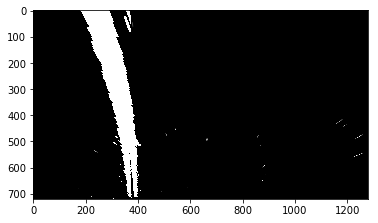

In [18]:
plt.imshow(out_img[:,:,0], cmap='gray')

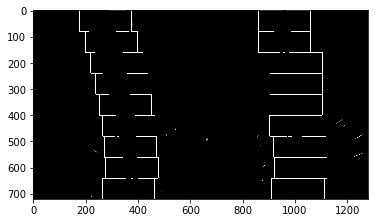

In [19]:
plt.imshow(out_img[:,:,1], cmap='gray')

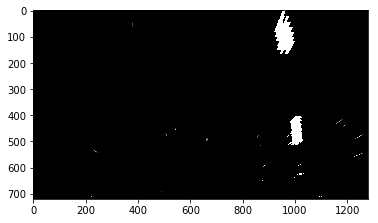

In [20]:
plt.imshow(out_img[:,:,2], cmap='gray')

In [21]:
binary = np.zeros_like(out_img[:,:,0])
binary[out_img[:,:,0]>0] = 1
binary[out_img[:,:,1]>0] = 1
binary[out_img[:,:,2]>0] = 1

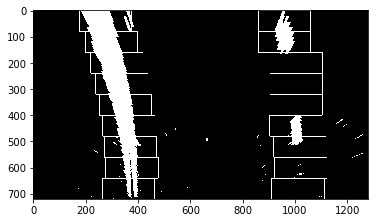

In [22]:
plt.imshow(binary, cmap='gray')

In [23]:
def show_lane(binary_warped, left_lane_inds, right_lane_inds):
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#     out_img = binary_warped
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result

In [24]:
result = show_lane(binary_warped, left_lane_inds, right_lane_inds)

(720, 0)

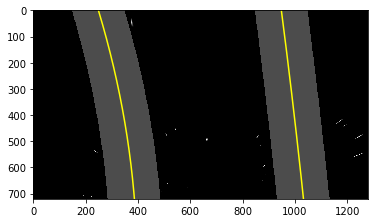

In [25]:
plt.imshow(result[:,:,1], cmap='gray')
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### 6. Determine the curvature

In [26]:
def pipeline(img):
    
    dist = cal_undistort(img, objpoints, imgpoints)
    
    binary_warped = warp_binary(dist)
        
    ##############
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
        
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()

    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 20
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if detect == False:
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                              & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                               & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

#     left_lane_inds, right_lane_inds = lane_points(binary_warped, )

    else: 
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                          & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                           & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
#     if any(left_lane_inds) and any(right_lane_inds):
# #         global detect = True

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ###############
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = 10
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(color_warp, np.int_([right_line_pts]), (0,0, 255))
    
    ##########################
    # unwarp the image
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(dist, 1, newwarp, 0.3, 0)
    

    ###########################    
    # Calculate the position of the vehicle
    middle = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos = img.shape[1]//2
    xm_per_pix = 3.7/700
    dx = (veh_pos - middle)*xm_per_pix # Positive on right, Negative on left
    
    left_curverad = curvature(lefty, leftx)
    right_curverad = curvature(righty, rightx)
    # Now our radius of curvature is in meters
    
    # show curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,'Left curvature = %.2f m'%(left_curverad),(50,40), font, 1,(255,255,255),3)
    cv2.putText(result,'Right curvature = %.2f m'%(right_curverad),(50,70), font, 1,(255,255,255),3)
    cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,100), 
                        font, 1,(255,255,255),3)

    return result

In [27]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [28]:
def curvature(yval, xval):
    # Define conversions in x and y from pixels space to meters   
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(yval)
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(yval*ym_per_pix, xval*xm_per_pix, 2)
    # Calculate the new radii of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    # Now our radius of curvature is in meters
    return curverad

In [29]:
img_size = (1280, 720)
src = np.float32(
            [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
            [((img_size[0] / 6) - 10), img_size[1]],
            [(img_size[0] * 5 / 6) + 60, img_size[1]],
            [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
            [[(img_size[0] / 4), 0],
            [(img_size[0] / 4), img_size[1]],
            [(img_size[0] * 3 / 4), img_size[1]],
            [(img_size[0] * 3 / 4), 0]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = np.linalg.inv(M)

In [30]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def set_radius_of_curvature(self):
                # Define conversions in x and y from pixels space to meters   
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(self.ally)
        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(self.ally*ym_per_pix, self.allx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        self.radius_of_curvature = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        # Now our radius of curvature is in meters
        return self.radius_of_curvature
    
    def set_all_xy(self, binary_warped, left=True):
        histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
            
        if left:
            x_base = np.argmax(histogram[:midpoint])
        else:
            x_base = np.argmax(histogram[midpoint:]) + midpoint
            
        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()

        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        x_current = x_base

        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 20
        # Create empty lists to receive left and right lane pixel indices
        lane_inds = []

        if not self.detected:
            # Step through the windows one by one
            for window in range(nwindows):
                # Identify window boundaries in x and y (and right and left)
                win_y_low = binary_warped.shape[0] - (window+1)*window_height
                win_y_high = binary_warped.shape[0] - window*window_height
                win_xleft_low = x_current - margin
                win_xleft_high = x_current + margin
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                                  & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
                # Append these indices to the lists
                lane_inds.append(good_left_inds)
#                 right_lane_inds.append(good_right_inds)
                # If you found > minpix pixels, recenter next window on their mean position
                if len(good_left_inds) > minpix:
                    leftx_current = np.int(np.mean(nonzerox[good_left_inds]))

            # Concatenate the arrays of indices
            lane_inds = np.concatenate(lane_inds)

        else: 
            lane_inds = ((nonzerox > (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] - margin)) 
                              & (nonzerox < (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] + margin))) 
        

        # Extract left and right line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds] 
        
        if any(self.allx):
            self.recent_xfitted.append(self.allx)
            self.detected = True
        else:
            self.allx = self.recent_xfitted[-1]
            self.detected = False
            
        return self.allx, self.ally
            
    def set_current_fit(self):
        # Fit a second order polynomial to each
#         if self.detected:
        self.current_fit = np.polyfit(self.ally, self.allx, 2)
        return self.current_fit
    def get_best_x(self):
        self.bestx = np.average(self.recent_xfitted[-5:], axis=0)
        assert(len(self.bestx==3))
#         return self.bestx
    def set_best_fit(self):
        self.get_best_x()
        self.best_fit = np.polyfit(self.ally, self.bestx, 2)
        return self.best_fit

In [31]:
def pipeline(img):
    
    undist = cal_undistort(img, objpoints, imgpoints)
    
    binary_warped = warp_binary(undist)
        
    ##############
    # Extract left and right line pixel positions
    leftx, lefty = left_lane.set_all_xy(binary_warped, left=True)
    rightx, righty = right_lane.set_all_xy(binary_warped, left=False)
    
    # Fit a second order polynomial to each

    left_fit = left_lane.set_current_fit()
    right_fit = right_lane.set_current_fit()
#     left_fit = left_lane.set_best_fit()
#     right_fit = right_lane.set_best_fit()
        
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    ###############
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = 10
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(color_warp, np.int_([right_line_pts]), (0,0, 255))
    

    ##########################
    # unwarp the image
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image

    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    ###########################    
    # Calculate the position of the vehicle
    middle = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos = img.shape[1]//2
    xm_per_pix = 3.7/700
    dx = (veh_pos - middle)*xm_per_pix # Positive on right, Negative on left
    
    left_curverad = left_lane.set_radius_of_curvature()
    right_curverad = right_lane.set_radius_of_curvature()
    # Now our radius of curvature is in meters
    
    # show curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,'Left curvature = %.2f m'%(left_curverad),(50,40), font, 1,(255,255,255),3)
    cv2.putText(result,'Right curvature = %.2f m'%(right_curverad),(50,70), font, 1,(255,255,255),3)
    cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,100), 
                        font, 1,(255,255,255),3)

    return result

/Users/RyanG/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:38: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


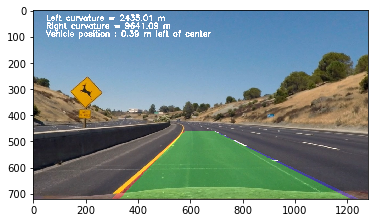

In [32]:
image = mpimg.imread('test_images/test2.jpg')
left_lane = Line()
right_lane = Line()
results = pipeline(image)
plt.imshow(results)

### Video Process

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
left_lane = Line()
right_lane = Line()
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output, audio=False)